### Functions & define

In [113]:
import numpy as np
from matplotlib import pyplot as plt

def load_session_data(subject, date):
    """Load all data for a given subject and date"""
    import sys
    sys.path.append(r'D:\Neural-Pipeline\source')
    from analysis_utils.NeuralDataLoader import NeuralDataLoader, Dots3DMPConfig
    
    # Load session
    loader = NeuralDataLoader()
    loader.load_session(subject, date)
    config = Dots3DMPConfig(subject)

    # spike data (unit, trial, time)
    stimOn_spikes = loader.get_spike_data(alignment='stimOn', good_units_only=True, good_trials_only=True)
    saccOnset_spikes = loader.get_spike_data(alignment='saccOnset', good_units_only=True, good_trials_only=True)
    postTargHold_spikes = loader.get_spike_data(alignment='postTargHold', good_units_only=True, good_trials_only=True)
    tuning_spikes = loader.get_tuning_data(good_units_only=True, good_trials_only=True)

    # behavioral data
    behavior_dots3DMP = loader.get_behavioral_data(task='dots3DMP', good_trials_only=True)
    behavior_tuning = loader.get_behavioral_data(task='tuning', good_trials_only=True)
    behavior_converted = config.convert_behavioral_data(behavior_dots3DMP, task='dots3DMP')
    behavior_tuning_converted = config.convert_behavioral_data(behavior_tuning, task='tuning')

    # Unit Info
    unit_info = loader.get_unit_info(good_units_only=True)
    MST_units = loader.get_units_by_area(unit_info, area_name='MST')
    VPS_units = loader.get_units_by_area(unit_info, area_name='VPS')
    dual_units = loader.get_units_by_area(unit_info, area_name='dual')

    # Time Info
    time_info = config.get_time_Info('dots3DMP')
    time_info_tuning = config.get_time_Info('tuning')
    time_axes_dots3DMP = config.get_time_axes('dots3DMP')

    # Prepare data
    spikes_data = {
        'stimOn': stimOn_spikes,
        'saccOnset': saccOnset_spikes,
        'postTargHold': postTargHold_spikes
    }
    
    units_data = {
        'MST': MST_units,
        'VPS': VPS_units,
        'dual': dual_units
    }
    
    return {
        'loader': loader,
        'config': config,
        'spikes_data': spikes_data,
        'behavior_converted': behavior_converted,
        'behavior_tuning_converted': behavior_tuning_converted,
        'unit_info': unit_info,
        'units_data': units_data,
        'time_axes_dots3DMP': time_axes_dots3DMP,
        'time_info': time_info,
        'time_info_tuning': time_info_tuning
    }

def calculate_decision_variable(y_test, y_proba, epsilon=1e-10):
    """
    Calculate decision variable from classifier probabilities
    Handles both single values and arrays
    """
    # Convert to arrays if single values
    if np.isscalar(y_test):
        y_test = np.array([y_test])
        y_proba = np.array([y_proba])
        single_value = True
    else:
        single_value = False
    
    dvs = []
    for idx, val in enumerate(y_proba):
        if val < 0 or val > 1:
            raise ValueError(f"y_proba contains invalid probability value at index {idx}: {val}. Must be in [0, 1].")
        y_test_ = int(y_test[idx])
        y_proba_ = float(y_proba[idx])
        # Ensure y_proba is in valid range [epsilon, 1-epsilon]
        y_proba_clipped = np.clip(y_proba_, epsilon, 1 - epsilon)
        
        # Calculate log-odds (decision variable)
        dv = np.log(y_proba_clipped / (1 - y_proba_clipped))
        
        # If true class is 0, flip the sign
        if y_test_ == 0:
            dv = -dv
        dvs.append(dv)
    
    if single_value:
        return dvs[0]  # Return single value
    else:
        return np.mean(dvs)  # Return mean for arrays

# Function to create file path based on modality/coherence condition
def get_filepath(date, area, alignment, target, mod, coh, regression='decoders_partialregression'):
    subject = 'zarya'
    if target == 'stimulus':
        trial_condition = 'correct_non_zero'
    elif target == 'choice':    
        trial_condition = 'non_zero'
    elif target == 'PDW':
        trial_condition = 'small_heading_single_target'

    decoder_folder = f"D:\\Neural-Pipeline\\results\\analysis_population\\{regression}"

    return f"{decoder_folder}\\{subject}_{date}_{area}_{target}_{alignment}_train_mod{mod}_coh{coh}_test_mod{mod}_coh{coh}_{trial_condition}_cv_results.npy"

def calculate_baseline_correction(time_points, dv_mean, accuracy_mean, baseline_window):

    start_time, end_time = baseline_window
    baseline_indices = [idx for idx, t in enumerate(time_points) if start_time <= t < end_time]
    
    baseline_dv = 0
    baseline_accuracy = 0
    
    if baseline_indices:
        baseline_dv_values = [dv_mean[idx] for idx in baseline_indices if not np.isnan(dv_mean[idx])]
        baseline_acc_values = [accuracy_mean[idx] for idx in baseline_indices if not np.isnan(accuracy_mean[idx])]
        
        if baseline_dv_values:
            baseline_dv = np.nanmean(baseline_dv_values)
        if baseline_acc_values:
            baseline_accuracy = np.nanmean(baseline_acc_values)
    
    return baseline_dv, baseline_accuracy




In [114]:
subject = "zarya"
date = "20250602"
data_dict = load_session_data(subject, date)
time_axes_dots3DMP = data_dict['time_axes_dots3DMP']
zero_time = np.where(time_axes_dots3DMP['stimOn']<0)


# Define brain areas, alignments, and targets
areas = ['dual', 'MST', 'VPS']
alignments = ['stimOn', 'saccOnset', 'postTargHold']
targets = ['stimulus', 'choice', 'PDW']
area_colors = {'dual': 'blue', 'MST': 'red', 'VPS': 'black'}

# Alignment display names
alignment_names = {
    'stimOn': 'Stimulus On',
    'saccOnset': 'Choice', 
    'postTargHold': 'Confidence'
}
# Define modality/coherence conditions with their file parameters
modality_conditions = {
    'Vestibular Only': {'mod': 1, 'coh': 1},        # Row 0: mod1_coh1
    'Visual Low Coh': {'mod': 2, 'coh': 1},         # Row 1: mod2_coh1
    'Visual High Coh': {'mod': 2, 'coh': 2},        # Row 2: mod2_coh2
    'Combined Low Coh': {'mod': 3, 'coh': 1},       # Row 3: mod3_coh1
    'Combined High Coh': {'mod': 3, 'coh': 2}       # Row 4: mod3_coh2       
}

# Velocity profile markers for stimOn alignment
vel_markers = {
    'max_velocity': 0.66,
    'max_acceleration': 0.4,
}
# Define heading groups with colors (indices, color)
heading_groups = {
    '±10°': ([1, 7], "#7E0000"),
    '±3.9°': ([2, 6], "#B41D1D"),
    '±1.5°': ([3, 5], "#FF6767"),
    '0°': ([4], "#A2A2A2"),
    'All': ([1, 2, 3, 4, 5, 6, 7], '#000000')
}
# Define session dates to analyze
dates = ["20250602", "20250523","20250702", "20250710"]   




Loaded dots3DMP data: zarya20250602dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250602dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya


### plot choices, by modality and coherence, different heading angle


############################################################
PROCESSING TARGET: CHOICE - BY HEADING GROUPS
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840
    Processing ±10°...
      Processed 1840 trials for ±10°
      Time points: 46 from 0.000 to 45.000
      Baseline DV correction for ±10°: 0.7344
      Baseline accuracy correction for ±10°: 0.9220
      Applying corrections for ±10° - DV: 0.7344, Accuracy: 0.9220
    Processing ±3.9°...
      Processed 1840 trials for ±3.9°
      Time points: 46 from 0.000 to 45.000
      Baseline DV correction for ±3.9°: 0.6682
      Baseline accuracy correction for ±3.9°: 0.8964
      Applying corrections for ±3.9° - DV: 0.6682, Accuracy: 0.8964
    Processing ±1.5°...
      Processed 1840 tr

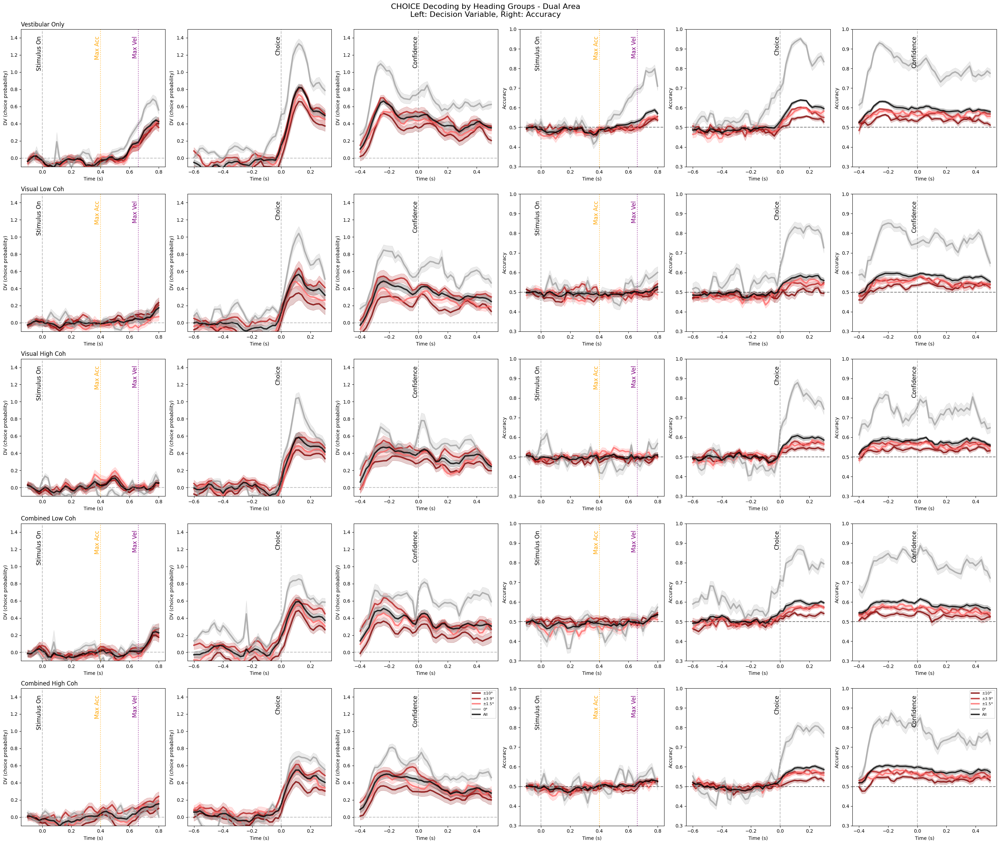

In [104]:
# Define heading groups with colors (indices, color)
heading_groups = {
    '±10°': ([1, 7], "#7E0000"),
    '±3.9°': ([2, 6], "#B41D1D"),
    '±1.5°': ([3, 5], "#FF6767"),
    '0°': ([4], "#A2A2A2"),
    'All': ([1, 2, 3, 4, 5, 6, 7], '#000000')
}

targets_to_plot = ['choice']
areas = ['dual']

baseline_corrections = {}

for target in targets_to_plot:
    print(f"\n{'#'*60}")
    print(f"PROCESSING TARGET: {target.upper()} - BY HEADING GROUPS")
    print(f"{'#'*60}")
    
    fig, axes = plt.subplots(5, 6, figsize=(30, 25))
    
    for j, alignment in enumerate(alignments):
        print(f"\n{'='*20} {alignment.upper()} {'='*20}")
        time_axes_condition = time_axes_dots3DMP[alignment]
        
        for area in areas:
            print(f"\n{area}:")
            
            for i, (condition_name, condition_params) in enumerate(modality_conditions.items()):
                mod = condition_params['mod']
                coh = condition_params['coh']
                
                print(f"\n  {condition_name} (mod={mod}, coh={coh}):")
                
                # Collect all trials (keep them intact)
                all_trials = []
                successful_dates = 0
                
                for date in dates:
                    filepath = get_filepath(date, area, alignment, target, mod, coh)
                    
                    try:
                        results = np.load(filepath, allow_pickle=True).item()
                        trial_results = results['trial_results']
                        all_trials.extend(trial_results)
                        successful_dates += 1
                        print(f"    {date}: loaded {len(trial_results)} trials")
                    except FileNotFoundError:
                        print(f"    {date}: File not found")
                        continue
                    except Exception as e:
                        print(f"    {date}: Error - {str(e)}")
                        continue
                
                if successful_dates == 0:
                    print(f"    No data found for {condition_name}")
                    continue
                
                print(f"    Total trials: {len(all_trials)}")
                
                # Set target-specific labels
                if target == 'choice':
                    ylabel = 'DV (choice probability)'
                elif target == 'PDW':
                    ylabel = 'DV (confidence)'
                
                # Process each heading group
                heading_results = {}
                
                for group_name, (heading_indices, color) in heading_groups.items():
                    print(f"    Processing {group_name}...")
                    
                    # Initialize baseline corrections for this heading group
                    if group_name not in baseline_corrections:
                        baseline_corrections[group_name] = {
                            'dv': 0,
                            'accuracy': 0
                        }
                    
                    # Store DV and accuracy for each trial for this heading condition
                    trials_dv_by_time = {}  # time -> list of DV values across trials
                    trials_accuracy_by_time = {}  # time -> list of accuracy values across trials
                    
                    trials_processed = 0
                    for trial in all_trials:
                        if 'test_behavior' in trial and 'headingInd' in trial['test_behavior']:
                            test_heading_indices = trial['test_behavior']['headingInd']
                            
                            # Create mask for samples that match this heading group
                            if group_name == 'All':
                                heading_mask = np.ones(len(test_heading_indices), dtype=bool)
                            else:
                                heading_mask = np.isin(test_heading_indices, heading_indices)
                            
                            # Skip if no samples match this heading condition
                            if not np.any(heading_mask):
                                continue
                            
                            # Filter trial data to only relevant samples
                            y_test_filtered = np.array(trial['y_test'])[heading_mask]
                            y_proba_filtered = np.array(trial['y_proba'])[heading_mask]
                            y_pred_filtered = np.array(trial['y_pred'])[heading_mask]
                            
                            # Calculate DV and accuracy for this trial for this heading condition
                            trial_dvs = []
                            trial_correct = []
                            
                            for y_t, y_p, y_pred in zip(y_test_filtered, y_proba_filtered, y_pred_filtered):
                                dv = calculate_decision_variable(y_t, y_p)
                                trial_dvs.append(dv)
                                
                                # Calculate accuracy for this sample
                                trial_correct.append(1 if y_pred == y_t else 0)
                            
                            # Get mean DV and accuracy for this trial for this heading condition
                            if trial_dvs:  # Make sure we have data
                                trial_mean_dv = np.mean(trial_dvs)
                                trial_mean_accuracy = np.mean(trial_correct)
                                
                                # Store by time point
                                time_point = trial['time']
                                if time_point not in trials_dv_by_time:
                                    trials_dv_by_time[time_point] = []
                                    trials_accuracy_by_time[time_point] = []
                                
                                trials_dv_by_time[time_point].append(trial_mean_dv)
                                trials_accuracy_by_time[time_point].append(trial_mean_accuracy)
                                trials_processed += 1
                    
                    print(f"      Processed {trials_processed} trials for {group_name}")
                    
                    if not trials_dv_by_time:
                        print(f"      No valid data for {group_name}, skipping...")
                        continue
                    
                    # Calculate mean and std across trials for each time point
                    time_points = sorted(trials_dv_by_time.keys())
                    print(f"      Time points: {len(time_points)} from {min(time_points):.3f} to {max(time_points):.3f}")
                    
                    dv_mean = []
                    dv_std = []
                    accuracy_mean = []
                    accuracy_std = []
                    
                    for t in time_points:
                        if t in trials_dv_by_time and len(trials_dv_by_time[t]) > 0:
                            # DV statistics
                            dv_values = trials_dv_by_time[t]
                            dv_mean.append(np.mean(dv_values))
                            dv_std.append(np.std(dv_values) / np.sqrt(len(dv_values)))
                            
                            # Accuracy statistics
                            acc_values = trials_accuracy_by_time[t]
                            accuracy_mean.append(np.mean(acc_values))
                            accuracy_std.append(np.std(acc_values) / np.sqrt(len(acc_values)))
                        else:
                            dv_mean.append(np.nan)
                            dv_std.append(0)
                            accuracy_mean.append(0.5)
                            accuracy_std.append(0)
                    
                    # Calculate and store baseline corrections when processing stimOn alignment
                    if alignment == 'stimOn':
                        baseline_indices = range(0, zero_time[0][-1])  # Indices before time zero
                        
                        if baseline_indices:  # Make sure we have baseline data
                            baseline_dv_values = [dv_mean[idx] for idx in baseline_indices if not np.isnan(dv_mean[idx])]
                            baseline_acc_values = [accuracy_mean[idx] for idx in baseline_indices if not np.isnan(accuracy_mean[idx])]
                            
                            if baseline_dv_values:
                                baseline_corrections[group_name]['dv'] = np.nanmean(baseline_dv_values)
                            
                            if baseline_acc_values:
                                baseline_corrections[group_name]['accuracy'] = np.nanmean(baseline_acc_values)
                            print(f"      Baseline DV correction for {group_name}: {baseline_corrections[group_name]['dv']:.4f}")
                            print(f"      Baseline accuracy correction for {group_name}: {baseline_corrections  [group_name]['accuracy']:.4f}")
                    
                    # Apply corrections using stored values
                    correct_baseline_dv = baseline_corrections[group_name]['dv']
                    correct_baseline_accuracy = baseline_corrections[group_name]['accuracy']

                    
                    print(f"      Applying corrections for {group_name} - DV: {correct_baseline_dv:.4f}, Accuracy: {correct_baseline_accuracy:.4f}")
                    
                    # Apply baseline corrections
                    dv_mean_corrected = [val - correct_baseline_dv if not np.isnan(val) else np.nan for val in dv_mean]
                    accuracy_mean_corrected = [val - correct_baseline_accuracy + 0.5 if not np.isnan(val) else np.nan for val in accuracy_mean]
                    
                    # Store results for this heading group
                    heading_results[group_name] = {
                        'dv_mean': dv_mean_corrected,
                        'dv_std': dv_std,
                        'accuracy_mean': accuracy_mean_corrected,
                        'accuracy_std': accuracy_std,
                        'color': color,
                        'n_trials': trials_processed,
                        'time_points': time_points
                    }
                
                # Plot all heading groups for this condition
                for group_name, results in heading_results.items():
                    if len(results['dv_mean']) > 0 and not all(np.isnan(results['dv_mean'])):
                        # Plot DV
                        ax_dv = axes[i, j]
                        ax_dv.plot(time_axes_condition, results['dv_mean'], 
                                   color=results['color'], linestyle='-', 
                                   linewidth=3, label=group_name, alpha=0.8)
                        ax_dv.fill_between(time_axes_condition, 
                                           np.array(results['dv_mean']) - np.array(results['dv_std']),
                                           np.array(results['dv_mean']) + np.array(results['dv_std']),
                                           alpha=0.2, color=results['color'])
                        
                        # Plot Accuracy
                        ax_accuracy = axes[i, j + 3]
                        ax_accuracy.plot(time_axes_condition, results['accuracy_mean'], 
                                         color=results['color'], linestyle='-', 
                                         linewidth=3, label=group_name, alpha=0.8)
                        ax_accuracy.fill_between(time_axes_condition, 
                                                 np.array(results['accuracy_mean']) - np.array(results['accuracy_std']),
                                                 np.array(results['accuracy_mean']) + np.array(results['accuracy_std']),
                                                 alpha=0.2, color=results['color'])
        
        # Format subplots (same as before)
        for i, condition_name in enumerate(modality_conditions.keys()):
            # Format DV subplot
            ax_dv = axes[i, j]
            ax_dv.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
            ax_dv.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            if alignment == 'stimOn':
                ax_dv.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_dv.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
                ax_dv.text(vel_markers['max_acceleration'], 0.95, 'Max Acc', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='orange', fontsize=12, transform=ax_dv.get_xaxis_transform())
                ax_dv.text(vel_markers['max_velocity'], 0.95, 'Max Vel', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='purple', fontsize=12, transform=ax_dv.get_xaxis_transform())
            
            ax_dv.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='black', fontsize=12,
                       transform=ax_dv.get_xaxis_transform())
            
            ax_dv.set_xlabel('Time (s)')
            ax_dv.set_ylabel(ylabel)
            
            if j == 0:
                ax_dv.set_title(f'{condition_name}', fontsize=12, loc='left')
            
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_dv.legend(fontsize=8)

            ax_dv.set_ylim(-0.1, 1.5) 
            
            # Format Accuracy subplot
            ax_accuracy = axes[i, j + 3]
            ax_accuracy.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
            ax_accuracy.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            if alignment == 'stimOn':
                ax_accuracy.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_accuracy.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
                ax_accuracy.text(vel_markers['max_acceleration'], 0.95, 'Max Acc', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='orange', fontsize=12, transform=ax_accuracy.get_xaxis_transform())
                ax_accuracy.text(vel_markers['max_velocity'], 0.95, 'Max Vel', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='purple', fontsize=12, transform=ax_accuracy.get_xaxis_transform())
            
            ax_accuracy.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='black', fontsize=12,
                       transform=ax_accuracy.get_xaxis_transform())
            
            ax_accuracy.set_xlabel('Time (s)')
            ax_accuracy.set_ylabel('Accuracy')
            
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_accuracy.legend(fontsize=8)
            
            ax_accuracy.set_ylim(0.3, 1.0)
    
    fig.suptitle(f'{target.upper()} Decoding by Heading Groups - Dual Area\nLeft: Decision Variable, Right: Accuracy', 
                 fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, left=0.05)
    
    save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\{target}_decoding_{area}_by_heading_zarya.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"\nFigure saved as: {save_filename}")
    
    plt.show()

### plot stimulus, by modality and coherence, different heading angle


############################################################
PROCESSING TARGET: STIMULUS - BY HEADING GROUPS (ALL TRIALS POOLED)
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840
    Processing ±10° (all trials pooled)...
      Processed 1840 trials for ±10°
    Processing ±3.9° (all trials pooled)...
      Processed 1840 trials for ±3.9°
    Processing ±1.5° (all trials pooled)...
      Processed 1840 trials for ±1.5°
    Processing All (all trials pooled)...
      Processed 1840 trials for All

  Visual Low Coh (mod=2, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840
    Processing ±10° (all trials pooled)...
      Processed 

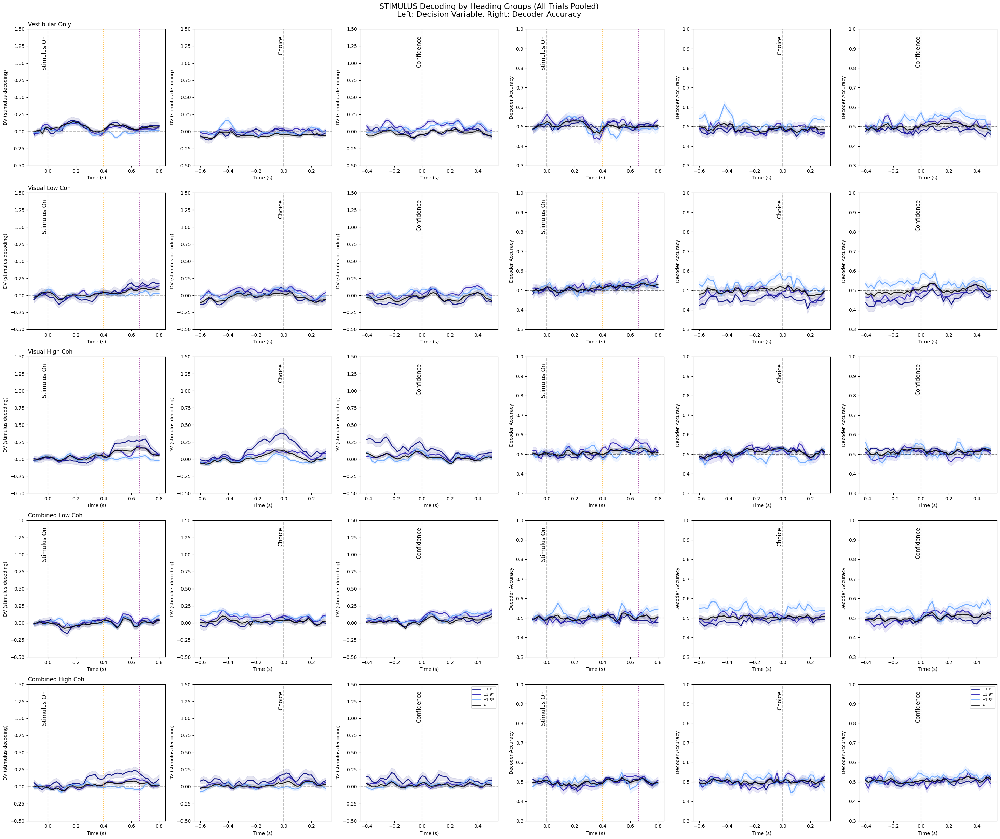

In [115]:
# Define heading groups with colors (indices, color) - no zero heading
heading_groups = {
    '±10°': ([1, 7], "#00047E"),
    '±3.9°': ([2, 6], "#2A1DB4"),
    '±1.5°': ([3, 5], "#67A4FF"),
    'All': ([1, 2, 3, 4, 5, 6, 7], '#000000')
}

# Remove correctness groups since we're pooling all trials
# correctness_groups = {
#     'Correct': 1,    # Monkey got it right
#     'Error': 0       # Monkey got it wrong
# }

targets_to_plot = ['stimulus']
areas = ['dual']

baseline_corrections = {}

for target in targets_to_plot:
    print(f"\n{'#'*60}")
    print(f"PROCESSING TARGET: {target.upper()} - BY HEADING GROUPS (ALL TRIALS POOLED)")
    print(f"{'#'*60}")
    
    fig, axes = plt.subplots(5, 6, figsize=(30, 25))
    
    for j, alignment in enumerate(alignments):
        print(f"\n{'='*20} {alignment.upper()} {'='*20}")
        time_axes_condition = time_axes_dots3DMP[alignment]
        
        for area in areas:
            print(f"\n{area}:")
            
            for i, (condition_name, condition_params) in enumerate(modality_conditions.items()):
                mod = condition_params['mod']
                coh = condition_params['coh']
                
                print(f"\n  {condition_name} (mod={mod}, coh={coh}):")
                
                # Collect all trials
                all_trials = []
                successful_dates = 0
                
                for date in dates:
                    filepath = get_filepath(date, area, alignment, target, mod, coh)
                    
                    try:
                        results = np.load(filepath, allow_pickle=True).item()
                        trial_results = results['trial_results']
                        all_trials.extend(trial_results)
                        successful_dates += 1
                        print(f"    {date}: loaded {len(trial_results)} trials")
                    except FileNotFoundError:
                        print(f"    {date}: File not found")
                        continue
                    except Exception as e:
                        print(f"    {date}: Error - {str(e)}")
                        continue
                
                if successful_dates == 0:
                    print(f"    No data found for {condition_name}")
                    continue
                
                print(f"    Total trials: {len(all_trials)}")
                
                # Set target-specific labels
                ylabel = 'DV (stimulus decoding)'
                
                # Process each heading group (pooling all correctness levels)
                heading_results = {}
                
                for group_name, (heading_indices, color) in heading_groups.items():
                    
                    print(f"    Processing {group_name} (all trials pooled)...")
                    
                    # Initialize baseline corrections
                    if group_name not in baseline_corrections:
                        baseline_corrections[group_name] = {
                            'dv': 0,
                            'accuracy': 0
                        }
                    
                    # Store DV and accuracy for each trial
                    trials_dv_by_time = {}
                    trials_accuracy_by_time = {}
                    
                    trials_processed = 0
                    for trial in all_trials:
                        if ('test_behavior' in trial and 
                            'headingInd' in trial['test_behavior'] and 
                            'correct' in trial['test_behavior']):
                            
                            test_heading_indices = trial['test_behavior']['headingInd']
                            
                            # Create mask for samples that match this heading group
                            if group_name == 'All':
                                heading_mask = np.ones(len(test_heading_indices), dtype=bool)
                            else:
                                heading_mask = np.isin(test_heading_indices, heading_indices)
                            
                            # Skip if no samples match this condition
                            if not np.any(heading_mask):
                                continue
                            
                            # Filter trial data to only relevant samples (no correctness filtering)
                            y_test_filtered = np.array(trial['y_test'])[heading_mask]
                            y_proba_filtered = np.array(trial['y_proba'])[heading_mask]
                            y_pred_filtered = np.array(trial['y_pred'])[heading_mask]
                            
                            # Calculate DV and accuracy for this trial
                            trial_dvs = []
                            trial_correct = []
                            
                            for y_t, y_p, y_pred in zip(y_test_filtered, y_proba_filtered, y_pred_filtered):
                                dv = calculate_decision_variable(y_t, y_p)
                                trial_dvs.append(dv)
                                # Model accuracy (how well decoder predicts stimulus)
                                trial_correct.append(1 if y_pred == y_t else 0)
                            
                            # Get mean DV and accuracy for this trial
                            if trial_dvs:
                                trial_mean_dv = np.mean(trial_dvs)
                                trial_mean_accuracy = np.mean(trial_correct)
                                
                                # Store by time point
                                time_point = trial['time']
                                if time_point not in trials_dv_by_time:
                                    trials_dv_by_time[time_point] = []
                                    trials_accuracy_by_time[time_point] = []
                                
                                trials_dv_by_time[time_point].append(trial_mean_dv)
                                trials_accuracy_by_time[time_point].append(trial_mean_accuracy)
                                trials_processed += 1
                    
                    print(f"      Processed {trials_processed} trials for {group_name}")
                    
                    if not trials_dv_by_time:
                        print(f"      No valid data for {group_name}, skipping...")
                        continue
                    
                    # Calculate mean and std across trials for each time point
                    time_points = sorted(trials_dv_by_time.keys())
                    
                    dv_mean = []
                    dv_std = []
                    accuracy_mean = []
                    accuracy_std = []
                    
                    for t in time_points:
                        if t in trials_dv_by_time and len(trials_dv_by_time[t]) > 0:
                            # DV statistics
                            dv_values = trials_dv_by_time[t]
                            dv_mean.append(np.mean(dv_values))
                            dv_std.append(np.std(dv_values) / np.sqrt(len(dv_values)))
                            
                            # Accuracy statistics
                            acc_values = trials_accuracy_by_time[t]
                            accuracy_mean.append(np.mean(acc_values))
                            accuracy_std.append(np.std(acc_values) / np.sqrt(len(acc_values)))
                        else:
                            dv_mean.append(np.nan)
                            dv_std.append(0)
                            accuracy_mean.append(0.5)
                            accuracy_std.append(0)
                    
                    # Calculate baseline corrections for stimOn alignment
                    if alignment == 'stimOn':
                        baseline_indices = range(0, zero_time[0][-1])
                        
                        if baseline_indices:
                            baseline_dv_values = [dv_mean[idx] for idx in baseline_indices if not np.isnan(dv_mean[idx])]
                            baseline_acc_values = [accuracy_mean[idx] for idx in baseline_indices if not np.isnan(accuracy_mean[idx])]
                            
                            if baseline_dv_values:
                                baseline_corrections[group_name]['dv'] = np.nanmean(baseline_dv_values)
                            
                            if baseline_acc_values:
                                baseline_corrections[group_name]['accuracy'] = np.nanmean(baseline_acc_values)
                    
                    # Apply corrections
                    correct_baseline_dv = baseline_corrections[group_name]['dv']
                    correct_baseline_accuracy = baseline_corrections[group_name]['accuracy']
                    
                    # Apply baseline corrections
                    dv_mean_corrected = [val - correct_baseline_dv if not np.isnan(val) else np.nan for val in dv_mean]
                    accuracy_mean_corrected = [val - correct_baseline_accuracy + 0.5 if not np.isnan(val) else np.nan for val in accuracy_mean]
                    
                    # Store results (solid line for all pooled trials)
                    heading_results[group_name] = {
                        'dv_mean': dv_mean_corrected,
                        'dv_std': dv_std,
                        'accuracy_mean': accuracy_mean_corrected,
                        'accuracy_std': accuracy_std,
                        'color': color,
                        'linestyle': '-',  # Always solid line
                        'alpha': 0.9,     # Standard alpha
                        'n_trials': trials_processed,
                        'time_points': time_points,
                        'label': f"{group_name}"  # Simplified label
                    }
                
                # Plot all heading groups
                for group_name, results in heading_results.items():
                    if len(results['dv_mean']) > 0 and not all(np.isnan(results['dv_mean'])):
                        # Plot DV
                        ax_dv = axes[i, j]
                        ax_dv.plot(time_axes_condition, results['dv_mean'], 
                                   color=results['color'], 
                                   linestyle=results['linestyle'],
                                   linewidth=2, 
                                   label=results['label'], 
                                   alpha=results['alpha'])
                        ax_dv.fill_between(time_axes_condition, 
                                           np.array(results['dv_mean']) - np.array(results['dv_std']),
                                           np.array(results['dv_mean']) + np.array(results['dv_std']),
                                           alpha=0.1, color=results['color'])
                        
                        # Plot Accuracy
                        ax_accuracy = axes[i, j + 3]
                        ax_accuracy.plot(time_axes_condition, results['accuracy_mean'], 
                                         color=results['color'], 
                                         linestyle=results['linestyle'],
                                         linewidth=2, 
                                         label=results['label'], 
                                         alpha=results['alpha'])
                        ax_accuracy.fill_between(time_axes_condition, 
                                                 np.array(results['accuracy_mean']) - np.array(results['accuracy_std']),
                                                 np.array(results['accuracy_mean']) + np.array(results['accuracy_std']),
                                                 alpha=0.1, color=results['color'])
        
        # Format subplots
        for i, condition_name in enumerate(modality_conditions.keys()):
            # Format DV subplot
            ax_dv = axes[i, j]
            ax_dv.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
            ax_dv.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            if alignment == 'stimOn':
                ax_dv.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_dv.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
            
            ax_dv.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='black', fontsize=12,
                       transform=ax_dv.get_xaxis_transform())
            
            ax_dv.set_xlabel('Time (s)')
            ax_dv.set_ylabel(ylabel)
            
            if j == 0:
                ax_dv.set_title(f'{condition_name}', fontsize=12, loc='left')
            
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_dv.legend(fontsize=8)

            ax_dv.set_ylim(-0.5, 1.5) 
            
            # Format Accuracy subplot
            ax_accuracy = axes[i, j + 3]
            ax_accuracy.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
            ax_accuracy.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            if alignment == 'stimOn':
                ax_accuracy.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_accuracy.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
            
            ax_accuracy.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='black', fontsize=12,
                       transform=ax_accuracy.get_xaxis_transform())
            
            ax_accuracy.set_xlabel('Time (s)')
            ax_accuracy.set_ylabel('Decoder Accuracy')
            
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_accuracy.legend(fontsize=8)
            
            ax_accuracy.set_ylim(0.3, 1.0)
    
    fig.suptitle(f'{target.upper()} Decoding by Heading Groups (All Trials Pooled)\nLeft: Decision Variable, Right: Decoder Accuracy', 
                 fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, left=0.05)
    
    save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\{target}_decoding_{area}_by_heading_pooled_zarya.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"\nFigure saved as: {save_filename}")
    
    plt.show()

### plot decoder accuracy comparisons


############################################################
DECODER ACCURACY COMPARISON - ZERO HEADINGS ONLY
LEFT: Choice Decoders | RIGHT: Stimulus Decoders
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    Processing choice_noregress...
      20250602: loaded 460 trials
      20250523: loaded 460 trials
      20250702: loaded 460 trials
      20250710: loaded 460 trials
      Total trials: 1840
        Processing Zero (0°)...
          Processed 1840 trials for Zero (0°)
    Processing choice_regress...
      20250602: loaded 460 trials
      20250523: loaded 460 trials
      20250702: loaded 460 trials
      20250710: loaded 460 trials
      Total trials: 1840
        Processing Zero (0°)...
          Processed 1840 trials for Zero (0°)
    Processing stimulus_noregress...
      20250602: loaded 460 trials
      20250523: loaded 460 trials
      20250702: loaded 460 trials
  

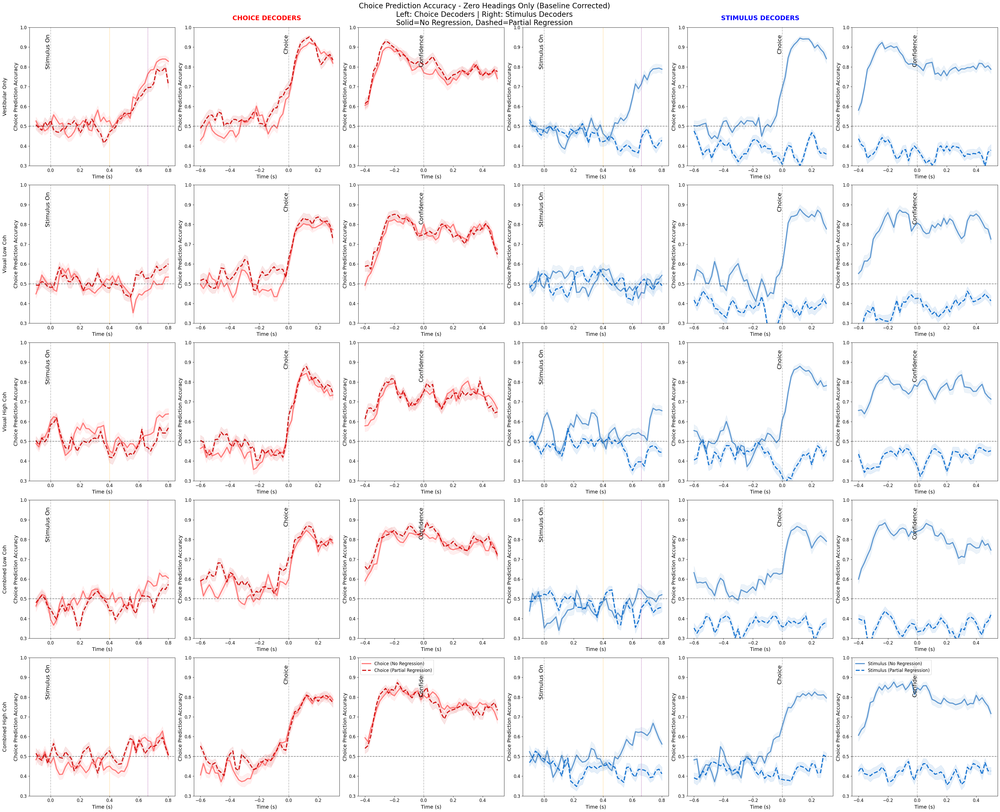

In [129]:
# Define heading groups - only zero heading now
heading_groups_comparison = {
    'Zero (0°)': [4]     
}

# Define decoder configurations - separate choice and stimulus
choice_decoder_configs = {
    'choice_noregress': {
        'target': 'choice',
        'regression': 'decoders_noregress',
        'color': "#FF6B6B",  # Bright coral
        'linestyle': '-',
        'linewidth': 3,
        'label': 'Choice (No Regression)'
    },
    'choice_regress': {
        'target': 'choice', 
        'regression': 'decoders_partialregression',
        'color': "#CC0000",  # Dark red
        'linestyle': '--',
        'linewidth': 3,
        'label': 'Choice (Partial Regression)'
    }
}

stimulus_decoder_configs = {
    'stimulus_noregress': {
        'target': 'stimulus',
        'regression': 'decoders_noregress',
        'color': "#4E8DCD",  # Bright teal
        'linestyle': '-', 
        'linewidth': 3,
        'label': 'Stimulus (No Regression)'
    },
    'stimulus_regress': {
        'target': 'stimulus',
        'regression': 'decoders_partialregression',
        'color': "#0066CC",  # Dark blue
        'linestyle': '--',
        'linewidth': 3,
        'label': 'Stimulus (Partial Regression)'
    }
}

areas = ['dual']

# Initialize baseline corrections
baseline_corrections = {}

print(f"\n{'#'*60}")
print(f"DECODER ACCURACY COMPARISON - ZERO HEADINGS ONLY")
print(f"LEFT: Choice Decoders | RIGHT: Stimulus Decoders")
print(f"{'#'*60}")

# Figure: 5 rows (conditions) x 6 columns (3 alignments x 2 decoder types)
fig, axes = plt.subplots(5, 6, figsize=(40, 32))

for j, alignment in enumerate(alignments):
    print(f"\n{'='*20} {alignment.upper()} {'='*20}")
    time_axes_condition = time_axes_dots3DMP[alignment]
    
    for area in areas:
        print(f"\n{area}:")
        
        for i, (condition_name, condition_params) in enumerate(modality_conditions.items()):
            mod = condition_params['mod']
            coh = condition_params['coh']
            
            print(f"\n  {condition_name} (mod={mod}, coh={coh}):")
            
            # Process CHOICE decoders (left columns)
            choice_results = {}
            
            for config_name, config in choice_decoder_configs.items():
                target = config['target']
                regression = config['regression']
                base_color = config['color']
                base_label = config['label']
                base_linestyle = config['linestyle']
                base_linewidth = config['linewidth']
                
                print(f"    Processing {config_name}...")
                
                # Collect all trials for this decoder configuration
                all_trials = []
                successful_dates = 0
                
                for date in dates:
                    filepath = get_filepath(date, area, alignment, target, mod, coh, regression)
                    
                    try:
                        results = np.load(filepath, allow_pickle=True).item()
                        trial_results = results['trial_results']
                        all_trials.extend(trial_results)
                        successful_dates += 1
                        print(f"      {date}: loaded {len(trial_results)} trials")
                    except FileNotFoundError:
                        print(f"      {date}: File not found")
                        continue
                    except Exception as e:
                        print(f"      {date}: Error - {str(e)}")
                        continue
                
                if successful_dates == 0:
                    print(f"      No data found for {config_name}")
                    continue
                
                print(f"      Total trials: {len(all_trials)}")
                
                # Process zero heading for this decoder
                heading_name = 'Zero (0°)'
                heading_indices = [4]
                
                print(f"        Processing {heading_name}...")
                
                # Initialize baseline corrections for this combination
                baseline_key = f"{config_name}_{heading_name}"
                if baseline_key not in baseline_corrections:
                    baseline_corrections[baseline_key] = {'accuracy': 0}
                
                # Store accuracy for each trial
                trials_accuracy_by_time = {}
                trials_processed = 0
                
                for trial in all_trials:
                    if ('test_behavior' in trial and 
                        'headingInd' in trial['test_behavior']):
                        
                        test_heading_indices = trial['test_behavior']['headingInd']
                        test_choices = trial['test_behavior'].get('choice', None)
                        
                        if test_choices is None:
                            continue
                            
                        test_choices = test_choices - 1
                        heading_mask = np.isin(test_heading_indices, heading_indices)
                        
                        if not np.any(heading_mask):
                            continue
                        
                        y_test_filtered = np.array(test_choices)[heading_mask]
                        y_pred_filtered = np.array(trial['y_pred'])[heading_mask]
                        
                        trial_correct = []
                        for y_choice, y_pred in zip(y_test_filtered, y_pred_filtered):
                            trial_correct.append(1 if y_pred == y_choice else 0)
                        
                        if trial_correct:
                            trial_mean_accuracy = np.mean(trial_correct)
                            time_point = trial['time']
                            
                            if time_point not in trials_accuracy_by_time:
                                trials_accuracy_by_time[time_point] = []
                            
                            trials_accuracy_by_time[time_point].append(trial_mean_accuracy)
                            trials_processed += 1
                
                print(f"          Processed {trials_processed} trials for {heading_name}")
                
                if not trials_accuracy_by_time:
                    print(f"          No valid data for {heading_name}, skipping...")
                    continue
                
                # Calculate mean and std across trials for each time point
                time_points = sorted(trials_accuracy_by_time.keys())
                accuracy_mean = []
                accuracy_std = []
                
                for t in time_points:
                    if t in trials_accuracy_by_time and len(trials_accuracy_by_time[t]) > 0:
                        acc_values = trials_accuracy_by_time[t]
                        accuracy_mean.append(np.mean(acc_values))
                        accuracy_std.append(np.std(acc_values) / np.sqrt(len(acc_values)))
                    else:
                        accuracy_mean.append(0.5)
                        accuracy_std.append(0)
                
                # Calculate baseline corrections for stimOn alignment
                if alignment == 'stimOn':
                    baseline_indices = range(0, zero_time[0][-1])
                    if baseline_indices:
                        baseline_acc_values = [accuracy_mean[idx] for idx in baseline_indices if not np.isnan(accuracy_mean[idx])]
                        if baseline_acc_values:
                            baseline_corrections[baseline_key]['accuracy'] = np.nanmean(baseline_acc_values)
                
                # Apply baseline corrections
                correct_baseline_accuracy = baseline_corrections[baseline_key]['accuracy']
                accuracy_mean_corrected = [val - correct_baseline_accuracy + 0.5 if not np.isnan(val) else np.nan for val in accuracy_mean]
                
                # Store results
                choice_results[config_name] = {
                    'accuracy_mean': accuracy_mean_corrected,
                    'accuracy_std': accuracy_std,
                    'color': base_color,
                    'linestyle': base_linestyle,
                    'linewidth': base_linewidth,
                    'alpha': 0.9,
                    'n_trials': trials_processed,
                    'time_points': time_points,
                    'label': base_label
                }
            
            # Process STIMULUS decoders (right columns) - same logic but for stimulus decoders
            stimulus_results = {}
            
            for config_name, config in stimulus_decoder_configs.items():
                target = config['target']
                regression = config['regression']
                base_color = config['color']
                base_label = config['label']
                base_linestyle = config['linestyle']
                base_linewidth = config['linewidth']
                
                print(f"    Processing {config_name}...")
                
                all_trials = []
                successful_dates = 0
                
                for date in dates:
                    filepath = get_filepath(date, area, alignment, target, mod, coh, regression)
                    
                    try:
                        results = np.load(filepath, allow_pickle=True).item()
                        trial_results = results['trial_results']
                        all_trials.extend(trial_results)
                        successful_dates += 1
                        print(f"      {date}: loaded {len(trial_results)} trials")
                    except FileNotFoundError:
                        print(f"      {date}: File not found")
                        continue
                    except Exception as e:
                        print(f"      {date}: Error - {str(e)}")
                        continue
                
                if successful_dates == 0:
                    print(f"      No data found for {config_name}")
                    continue
                
                print(f"      Total trials: {len(all_trials)}")
                
                heading_name = 'Zero (0°)'
                heading_indices = [4]
                
                baseline_key = f"{config_name}_{heading_name}"
                if baseline_key not in baseline_corrections:
                    baseline_corrections[baseline_key] = {'accuracy': 0}
                
                trials_accuracy_by_time = {}
                trials_processed = 0
                
                for trial in all_trials:
                    if ('test_behavior' in trial and 
                        'headingInd' in trial['test_behavior']):
                        
                        test_heading_indices = trial['test_behavior']['headingInd']
                        test_choices = trial['test_behavior'].get('choice', None)
                        
                        if test_choices is None:
                            continue
                            
                        test_choices = test_choices - 1
                        heading_mask = np.isin(test_heading_indices, heading_indices)
                        
                        if not np.any(heading_mask):
                            continue
                        
                        y_test_filtered = np.array(test_choices)[heading_mask]
                        y_pred_filtered = np.array(trial['y_pred'])[heading_mask]
                        
                        trial_correct = []
                        for y_choice, y_pred in zip(y_test_filtered, y_pred_filtered):
                            trial_correct.append(1 if y_pred == y_choice else 0)
                        
                        if trial_correct:
                            trial_mean_accuracy = np.mean(trial_correct)
                            time_point = trial['time']
                            
                            if time_point not in trials_accuracy_by_time:
                                trials_accuracy_by_time[time_point] = []
                            
                            trials_accuracy_by_time[time_point].append(trial_mean_accuracy)
                            trials_processed += 1
                
                if not trials_accuracy_by_time:
                    continue
                
                time_points = sorted(trials_accuracy_by_time.keys())
                accuracy_mean = []
                accuracy_std = []
                
                for t in time_points:
                    if t in trials_accuracy_by_time and len(trials_accuracy_by_time[t]) > 0:
                        acc_values = trials_accuracy_by_time[t]
                        accuracy_mean.append(np.mean(acc_values))
                        accuracy_std.append(np.std(acc_values) / np.sqrt(len(acc_values)))
                    else:
                        accuracy_mean.append(0.5)
                        accuracy_std.append(0)
                
                if alignment == 'stimOn':
                    baseline_indices = range(0, zero_time[0][-1])
                    if baseline_indices:
                        baseline_acc_values = [accuracy_mean[idx] for idx in baseline_indices if not np.isnan(accuracy_mean[idx])]
                        if baseline_acc_values:
                            baseline_corrections[baseline_key]['accuracy'] = np.nanmean(baseline_acc_values)
                
                correct_baseline_accuracy = baseline_corrections[baseline_key]['accuracy']
                accuracy_mean_corrected = [val - correct_baseline_accuracy + 0.5 if not np.isnan(val) else np.nan for val in accuracy_mean]
                
                stimulus_results[config_name] = {
                    'accuracy_mean': accuracy_mean_corrected,
                    'accuracy_std': accuracy_std,
                    'color': base_color,
                    'linestyle': base_linestyle,
                    'linewidth': base_linewidth,
                    'alpha': 0.9,
                    'n_trials': trials_processed,
                    'time_points': time_points,
                    'label': base_label
                }
            
            # Plot CHOICE results (left columns: j = 0, 1, 2)
            ax_choice = axes[i, j]
            for config_name, results in choice_results.items():
                if len(results['accuracy_mean']) > 0:
                    ax_choice.plot(time_axes_condition, results['accuracy_mean'], 
                                 color=results['color'], 
                                 linestyle=results['linestyle'],
                                 linewidth=results['linewidth'],
                                 label=results['label'], 
                                 alpha=results['alpha'])
                    ax_choice.fill_between(time_axes_condition, 
                                         np.array(results['accuracy_mean']) - np.array(results['accuracy_std']),
                                         np.array(results['accuracy_mean']) + np.array(results['accuracy_std']),
                                         alpha=0.1, color=results['color'])
            
            # Plot STIMULUS results (right columns: j + 3 = 3, 4, 5)
            ax_stimulus = axes[i, j + 3]
            for config_name, results in stimulus_results.items():
                if len(results['accuracy_mean']) > 0:
                    ax_stimulus.plot(time_axes_condition, results['accuracy_mean'], 
                                   color=results['color'], 
                                   linestyle=results['linestyle'],
                                   linewidth=results['linewidth'],
                                   label=results['label'], 
                                   alpha=results['alpha'])
                    ax_stimulus.fill_between(time_axes_condition, 
                                           np.array(results['accuracy_mean']) - np.array(results['accuracy_std']),
                                           np.array(results['accuracy_mean']) + np.array(results['accuracy_std']),
                                           alpha=0.1, color=results['color'])

# Format subplots
for i, condition_name in enumerate(modality_conditions.keys()):
    for j, alignment in enumerate(alignments):
        
        # Format CHOICE subplots (left columns)
        ax_choice = axes[i, j]
        ax_choice.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
        ax_choice.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
        
        if alignment == 'stimOn':
            ax_choice.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
            ax_choice.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
        
        ax_choice.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                     horizontalalignment='right', color='black', fontsize=16,
                     transform=ax_choice.get_xaxis_transform())
        
        ax_choice.set_xlabel('Time (s)', fontsize=14)
        ax_choice.set_ylabel('Choice Prediction Accuracy', fontsize=14)
        ax_choice.set_ylim(0.3, 1.0)
        ax_choice.tick_params(labelsize=12)
        
        if i == 0 and j == 1:  # Middle top for choice side
            ax_choice.set_title('CHOICE DECODERS', fontsize=18, fontweight='bold', pad=20, color='red')
        
        if j == 0:
            ax_choice.text(-0.15, 0.5, condition_name, rotation=90, verticalalignment='center', 
                         horizontalalignment='right', transform=ax_choice.transAxes, fontsize=14)
        
        if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
            ax_choice.legend(fontsize=12, loc='upper left')
        
        # Format STIMULUS subplots (right columns)
        ax_stimulus = axes[i, j + 3]
        ax_stimulus.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
        ax_stimulus.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
        
        if alignment == 'stimOn':
            ax_stimulus.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
            ax_stimulus.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
        
        ax_stimulus.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='black', fontsize=16,
                       transform=ax_stimulus.get_xaxis_transform())
        
        ax_stimulus.set_xlabel('Time (s)', fontsize=14)
        ax_stimulus.set_ylabel('Choice Prediction Accuracy', fontsize=14)
        ax_stimulus.set_ylim(0.3, 1.0)
        ax_stimulus.tick_params(labelsize=12)
        
        if i == 0 and j == 1:  # Middle top for stimulus side
            ax_stimulus.set_title('STIMULUS DECODERS', fontsize=18, fontweight='bold', pad=20, color='blue')
        
        if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
            ax_stimulus.legend(fontsize=12, loc='upper left')

fig.suptitle('Choice Prediction Accuracy - Zero Headings Only (Baseline Corrected)\nLeft: Choice Decoders | Right: Stimulus Decoders\nSolid=No Regression, Dashed=Partial Regression', 
             fontsize=20, y=0.98)

plt.tight_layout()
plt.subplots_adjust(top=0.95, left=0.06)

save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\choice_prediction_accuracy_zero_headings_choice_vs_stimulus_zarya.png"
plt.savefig(save_filename, dpi=300, bbox_inches='tight')
print(f"\nFigure saved as: {save_filename}")

plt.show()

### Archive_plot stimulus, by modalit and coherence, different heading angle and correctness


############################################################
PROCESSING TARGET: STIMULUS - BY HEADING GROUPS AND BEHAVIORAL CORRECTNESS
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840
    Processing ±10°_Correct...
      Processed 1840 trials for ±10°_Correct
    Processing ±10°_Error...
      Processed 0 trials for ±10°_Error
      No valid data for ±10°_Error, skipping...
    Processing ±3.9°_Correct...
      Processed 1840 trials for ±3.9°_Correct
    Processing ±3.9°_Error...
      Processed 1334 trials for ±3.9°_Error
    Processing ±1.5°_Correct...
      Processed 1840 trials for ±1.5°_Correct
    Processing ±1.5°_Error...
      Processed 1794 trials for ±1.5°_Error
    Processing All_Correct...
      Processed 1840 trials for 

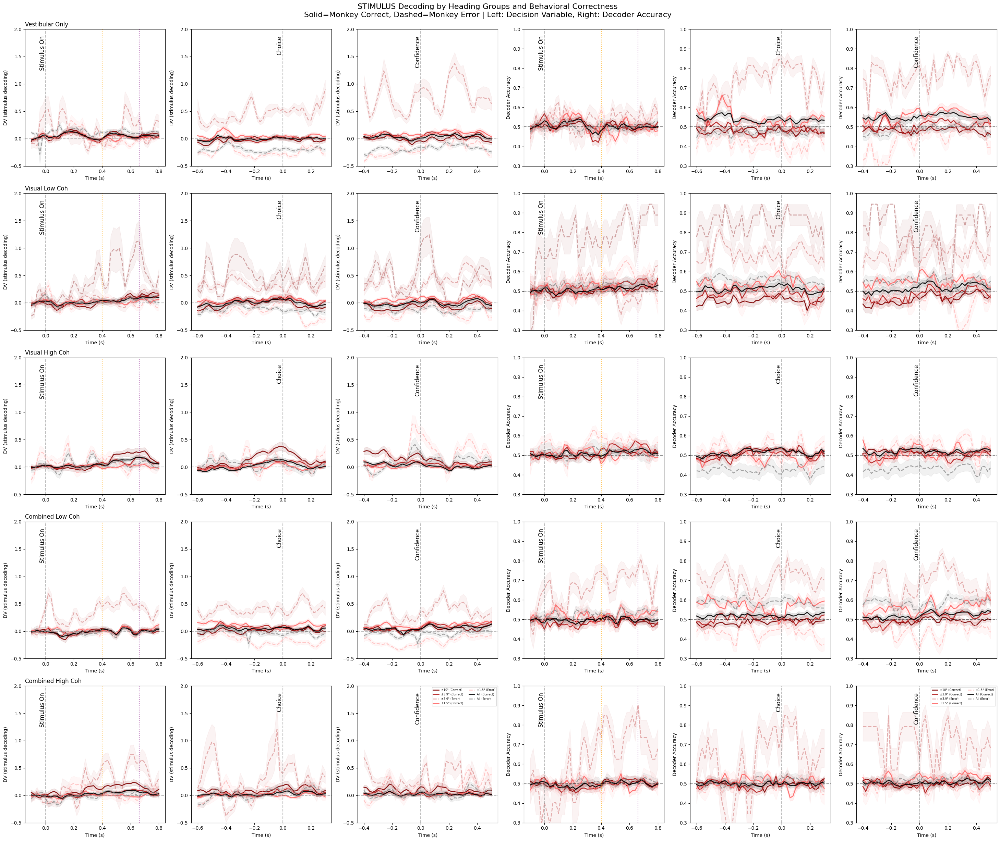

In [ ]:
# Define heading groups with colors (indices, color) - no zero heading
heading_groups = {
    '±10°': ([1, 7], "#7E0000"),
    '±3.9°': ([2, 6], "#B41D1D"),
    '±1.5°': ([3, 5], "#FF6767"),
    'All': ([1, 2, 3, 4, 5, 6, 7], '#000000')
}

# Define correctness groups
correctness_groups = {
    'Correct': 1,    # Monkey got it right
    'Error': 0       # Monkey got it wrong
}

targets_to_plot = ['stimulus']
areas = ['dual']

baseline_corrections = {}

for target in targets_to_plot:
    print(f"\n{'#'*60}")
    print(f"PROCESSING TARGET: {target.upper()} - BY HEADING GROUPS AND BEHAVIORAL CORRECTNESS")
    print(f"{'#'*60}")
    
    fig, axes = plt.subplots(5, 6, figsize=(30, 25))
    
    for j, alignment in enumerate(alignments):
        print(f"\n{'='*20} {alignment.upper()} {'='*20}")
        time_axes_condition = time_axes_dots3DMP[alignment]
        
        for area in areas:
            print(f"\n{area}:")
            
            for i, (condition_name, condition_params) in enumerate(modality_conditions.items()):
                mod = condition_params['mod']
                coh = condition_params['coh']
                
                print(f"\n  {condition_name} (mod={mod}, coh={coh}):")
                
                # Collect all trials
                all_trials = []
                successful_dates = 0
                
                for date in dates:
                    filepath = get_filepath(date, area, alignment, target, mod, coh)
                    
                    try:
                        results = np.load(filepath, allow_pickle=True).item()
                        trial_results = results['trial_results']
                        all_trials.extend(trial_results)
                        successful_dates += 1
                        print(f"    {date}: loaded {len(trial_results)} trials")
                    except FileNotFoundError:
                        print(f"    {date}: File not found")
                        continue
                    except Exception as e:
                        print(f"    {date}: Error - {str(e)}")
                        continue
                
                if successful_dates == 0:
                    print(f"    No data found for {condition_name}")
                    continue
                
                print(f"    Total trials: {len(all_trials)}")
                
                # Set target-specific labels
                ylabel = 'DV (stimulus decoding)'
                
                # Process each heading group × correctness combination
                heading_results = {}
                
                for group_name, (heading_indices, base_color) in heading_groups.items():
                    for correctness_name, correct_value in correctness_groups.items():
                        
                        # Create combined group name and color
                        combined_name = f"{group_name}_{correctness_name}"
                        
                        # Modify color based on correctness (darker for correct, lighter for error)
                        if correctness_name == 'Correct':
                            color = base_color  # Original color
                            linestyle = '-'     # Solid line
                            alpha = 0.9
                        else:  # Error trials
                            # Convert hex to RGB, make lighter
                            hex_color = base_color.lstrip('#')
                            rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
                            # Make lighter by averaging with white
                            lighter_rgb = tuple(int((c + 255) / 2) for c in rgb)
                            color = f"#{lighter_rgb[0]:02x}{lighter_rgb[1]:02x}{lighter_rgb[2]:02x}"
                            linestyle = '--'    # Dashed line
                            alpha = 0.7
                        
                        print(f"    Processing {combined_name}...")
                        
                        # Initialize baseline corrections
                        if combined_name not in baseline_corrections:
                            baseline_corrections[combined_name] = {
                                'dv': 0,
                                'accuracy': 0
                            }
                        
                        # Store DV and accuracy for each trial
                        trials_dv_by_time = {}
                        trials_accuracy_by_time = {}
                        
                        trials_processed = 0
                        for trial in all_trials:
                            if ('test_behavior' in trial and 
                                'headingInd' in trial['test_behavior'] and 
                                'correct' in trial['test_behavior']):
                                
                                test_heading_indices = trial['test_behavior']['headingInd']
                                test_correct_indices = trial['test_behavior']['correct']  # Behavioral correctness
                                
                                # Create mask for samples that match this heading group
                                if group_name == 'All':
                                    heading_mask = np.ones(len(test_heading_indices), dtype=bool)
                                else:
                                    heading_mask = np.isin(test_heading_indices, heading_indices)
                                
                                # Create mask for behavioral correctness
                                correctness_mask = (test_correct_indices == correct_value)
                                
                                # Combine masks
                                combined_mask = heading_mask & correctness_mask
                                
                                # Skip if no samples match this condition
                                if not np.any(combined_mask):
                                    continue
                                
                                # Filter trial data to only relevant samples
                                y_test_filtered = np.array(trial['y_test'])[combined_mask]
                                y_proba_filtered = np.array(trial['y_proba'])[combined_mask]
                                y_pred_filtered = np.array(trial['y_pred'])[combined_mask]
                                
                                # Calculate DV and accuracy for this trial
                                trial_dvs = []
                                trial_correct = []
                                
                                for y_t, y_p, y_pred in zip(y_test_filtered, y_proba_filtered, y_pred_filtered):
                                    dv = calculate_decision_variable(y_t, y_p)
                                    trial_dvs.append(dv)
                                    # Model accuracy (how well decoder predicts stimulus)
                                    trial_correct.append(1 if y_pred == y_t else 0)
                                
                                # Get mean DV and accuracy for this trial
                                if trial_dvs:
                                    trial_mean_dv = np.mean(trial_dvs)
                                    trial_mean_accuracy = np.mean(trial_correct)
                                    
                                    # Store by time point
                                    time_point = trial['time']
                                    if time_point not in trials_dv_by_time:
                                        trials_dv_by_time[time_point] = []
                                        trials_accuracy_by_time[time_point] = []
                                    
                                    trials_dv_by_time[time_point].append(trial_mean_dv)
                                    trials_accuracy_by_time[time_point].append(trial_mean_accuracy)
                                    trials_processed += 1
                        
                        print(f"      Processed {trials_processed} trials for {combined_name}")
                        
                        if not trials_dv_by_time:
                            print(f"      No valid data for {combined_name}, skipping...")
                            continue
                        
                        # Calculate mean and std across trials for each time point
                        time_points = sorted(trials_dv_by_time.keys())
                        
                        dv_mean = []
                        dv_std = []
                        accuracy_mean = []
                        accuracy_std = []
                        
                        for t in time_points:
                            if t in trials_dv_by_time and len(trials_dv_by_time[t]) > 0:
                                # DV statistics
                                dv_values = trials_dv_by_time[t]
                                dv_mean.append(np.mean(dv_values))
                                dv_std.append(np.std(dv_values) / np.sqrt(len(dv_values)))
                                
                                # Accuracy statistics
                                acc_values = trials_accuracy_by_time[t]
                                accuracy_mean.append(np.mean(acc_values))
                                accuracy_std.append(np.std(acc_values) / np.sqrt(len(acc_values)))
                            else:
                                dv_mean.append(np.nan)
                                dv_std.append(0)
                                accuracy_mean.append(0.5)
                                accuracy_std.append(0)
                        
                        # Calculate baseline corrections for stimOn alignment
                        if alignment == 'stimOn':
                            baseline_indices = range(0, zero_time[0][-1])
                            
                            if baseline_indices:
                                baseline_dv_values = [dv_mean[idx] for idx in baseline_indices if not np.isnan(dv_mean[idx])]
                                baseline_acc_values = [accuracy_mean[idx] for idx in baseline_indices if not np.isnan(accuracy_mean[idx])]
                                
                                if baseline_dv_values:
                                    baseline_corrections[combined_name]['dv'] = np.nanmean(baseline_dv_values)
                                
                                if baseline_acc_values:
                                    baseline_corrections[combined_name]['accuracy'] = np.nanmean(baseline_acc_values)
                        
                        # Apply corrections
                        correct_baseline_dv = baseline_corrections[combined_name]['dv']
                        correct_baseline_accuracy = baseline_corrections[combined_name]['accuracy']
                        
                        
                        # Apply baseline corrections
                        dv_mean_corrected = [val - correct_baseline_dv if not np.isnan(val) else np.nan for val in dv_mean]
                        accuracy_mean_corrected = [val - correct_baseline_accuracy + 0.5 if not np.isnan(val) else np.nan for val in accuracy_mean]
                        
                        # Store results
                        heading_results[combined_name] = {
                            'dv_mean': dv_mean_corrected,
                            'dv_std': dv_std,
                            'accuracy_mean': accuracy_mean_corrected,
                            'accuracy_std': accuracy_std,
                            'color': color,
                            'linestyle': linestyle,
                            'alpha': alpha,
                            'n_trials': trials_processed,
                            'time_points': time_points,
                            'label': f"{group_name} ({correctness_name})"
                        }
                
                # Plot all heading × correctness combinations
                for combined_name, results in heading_results.items():
                    if len(results['dv_mean']) > 0 and not all(np.isnan(results['dv_mean'])):
                        # Plot DV
                        ax_dv = axes[i, j]
                        ax_dv.plot(time_axes_condition, results['dv_mean'], 
                                   color=results['color'], 
                                   linestyle=results['linestyle'],
                                   linewidth=2, 
                                   label=results['label'], 
                                   alpha=results['alpha'])
                        ax_dv.fill_between(time_axes_condition, 
                                           np.array(results['dv_mean']) - np.array(results['dv_std']),
                                           np.array(results['dv_mean']) + np.array(results['dv_std']),
                                           alpha=0.1, color=results['color'])
                        
                        # Plot Accuracy
                        ax_accuracy = axes[i, j + 3]
                        ax_accuracy.plot(time_axes_condition, results['accuracy_mean'], 
                                         color=results['color'], 
                                         linestyle=results['linestyle'],
                                         linewidth=2, 
                                         label=results['label'], 
                                         alpha=results['alpha'])
                        ax_accuracy.fill_between(time_axes_condition, 
                                                 np.array(results['accuracy_mean']) - np.array(results['accuracy_std']),
                                                 np.array(results['accuracy_mean']) + np.array(results['accuracy_std']),
                                                 alpha=0.1, color=results['color'])
        
        # Format subplots
        for i, condition_name in enumerate(modality_conditions.keys()):
            # Format DV subplot
            ax_dv = axes[i, j]
            ax_dv.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
            ax_dv.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            if alignment == 'stimOn':
                ax_dv.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_dv.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
            
            ax_dv.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='black', fontsize=12,
                       transform=ax_dv.get_xaxis_transform())
            
            ax_dv.set_xlabel('Time (s)')
            ax_dv.set_ylabel(ylabel)
            
            if j == 0:
                ax_dv.set_title(f'{condition_name}', fontsize=12, loc='left')
            
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_dv.legend(fontsize=6, ncol=2)

            ax_dv.set_ylim(-0.5, 2) 
            
            # Format Accuracy subplot
            ax_accuracy = axes[i, j + 3]
            ax_accuracy.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
            ax_accuracy.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            if alignment == 'stimOn':
                ax_accuracy.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_accuracy.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
            
            ax_accuracy.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='black', fontsize=12,
                       transform=ax_accuracy.get_xaxis_transform())
            
            ax_accuracy.set_xlabel('Time (s)')
            ax_accuracy.set_ylabel('Decoder Accuracy')
            
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_accuracy.legend(fontsize=6, ncol=2)
            
            ax_accuracy.set_ylim(0.3, 1.0)
    
    fig.suptitle(f'{target.upper()} Decoding by Heading Groups and Behavioral Correctness\nSolid=Monkey Correct, Dashed=Monkey Error | Left: Decision Variable, Right: Decoder Accuracy', 
                 fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, left=0.05)
    
    save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\{target}_decoding_{area}_by_heading_behavioral_correctness_zarya.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"\nFigure saved as: {save_filename}")
    
    plt.show()

### Archive_plot results by modality and coherence, Prob and AUC


############################################################
PROCESSING TARGET: STIMULUS - BY MODALITY/COHERENCE
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840 from 4 dates

  Visual Low Coh (mod=2, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840 from 4 dates

  Visual High Coh (mod=2, coh=2):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840 from 4 dates

  Combined Low Coh (mod=3, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Tota

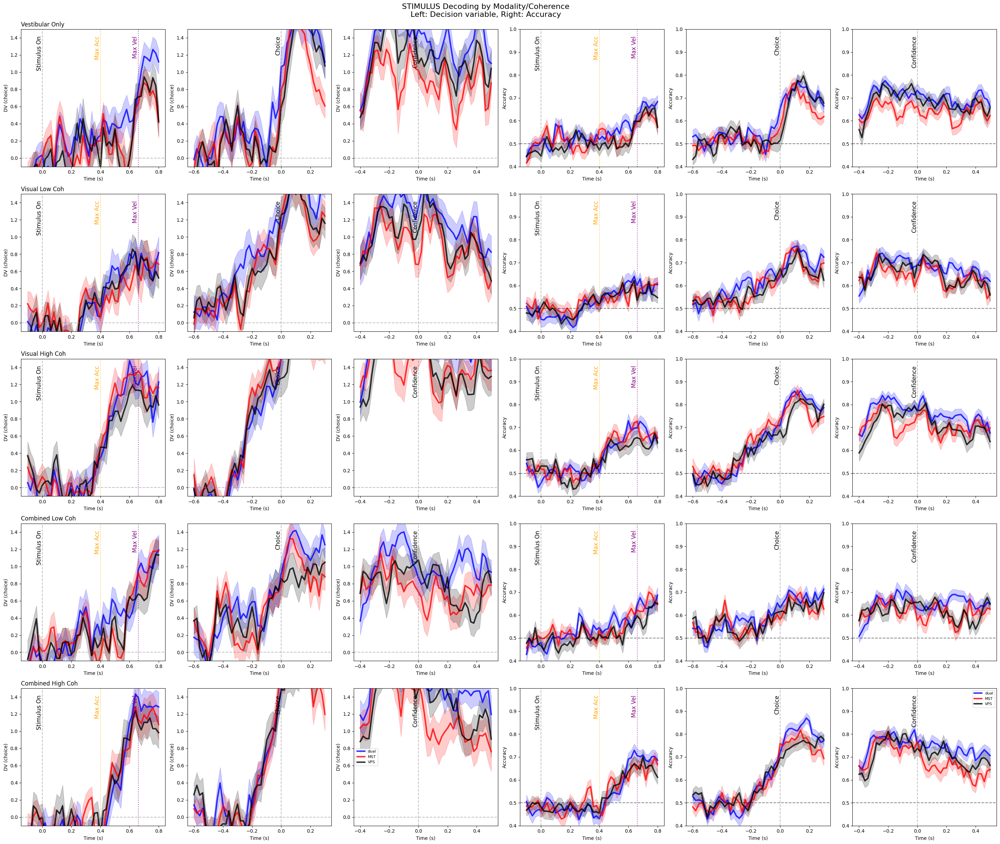


############################################################
PROCESSING TARGET: CHOICE - BY MODALITY/COHERENCE
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840 from 4 dates

  Visual Low Coh (mod=2, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840 from 4 dates

  Visual High Coh (mod=2, coh=2):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840 from 4 dates

  Combined Low Coh (mod=3, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total 

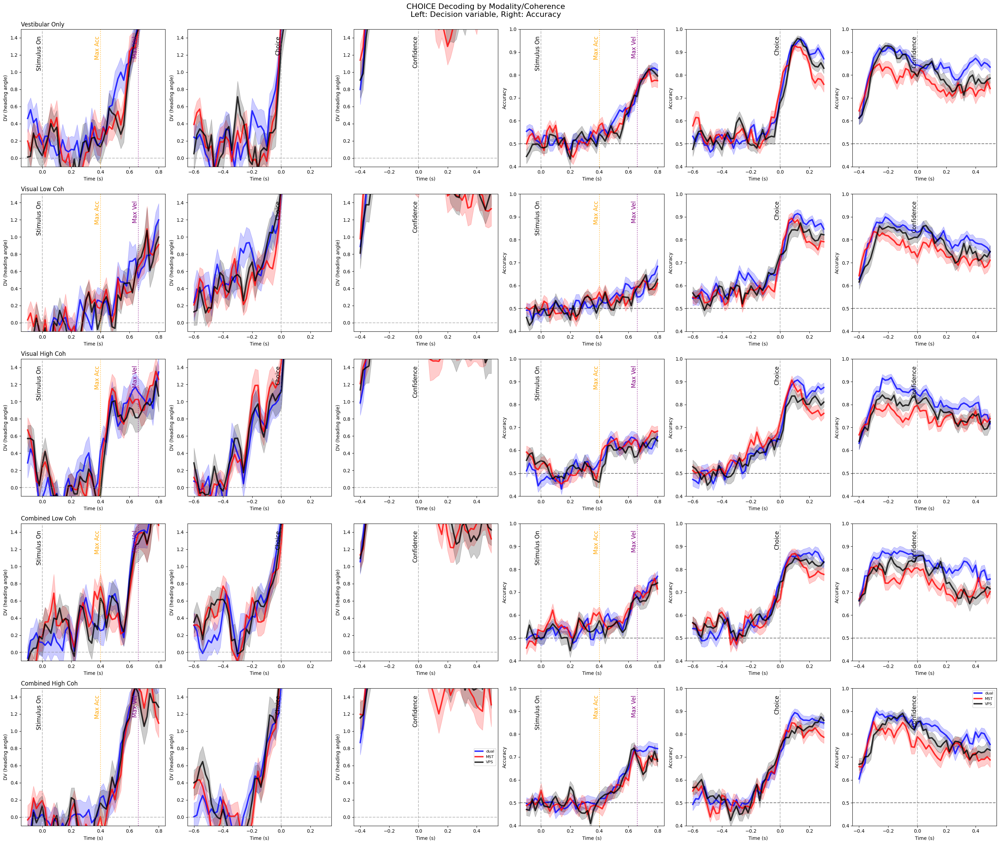


############################################################
PROCESSING TARGET: PDW - BY MODALITY/COHERENCE
############################################################

==================== STIMON ====================

dual:

  Vestibular Only (mod=1, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840 from 4 dates

  Visual Low Coh (mod=2, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840 from 4 dates

  Visual High Coh (mod=2, coh=2):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total trials: 1840 from 4 dates

  Combined Low Coh (mod=3, coh=1):
    20250602: loaded 460 trials
    20250523: loaded 460 trials
    20250702: loaded 460 trials
    20250710: loaded 460 trials
    Total tri

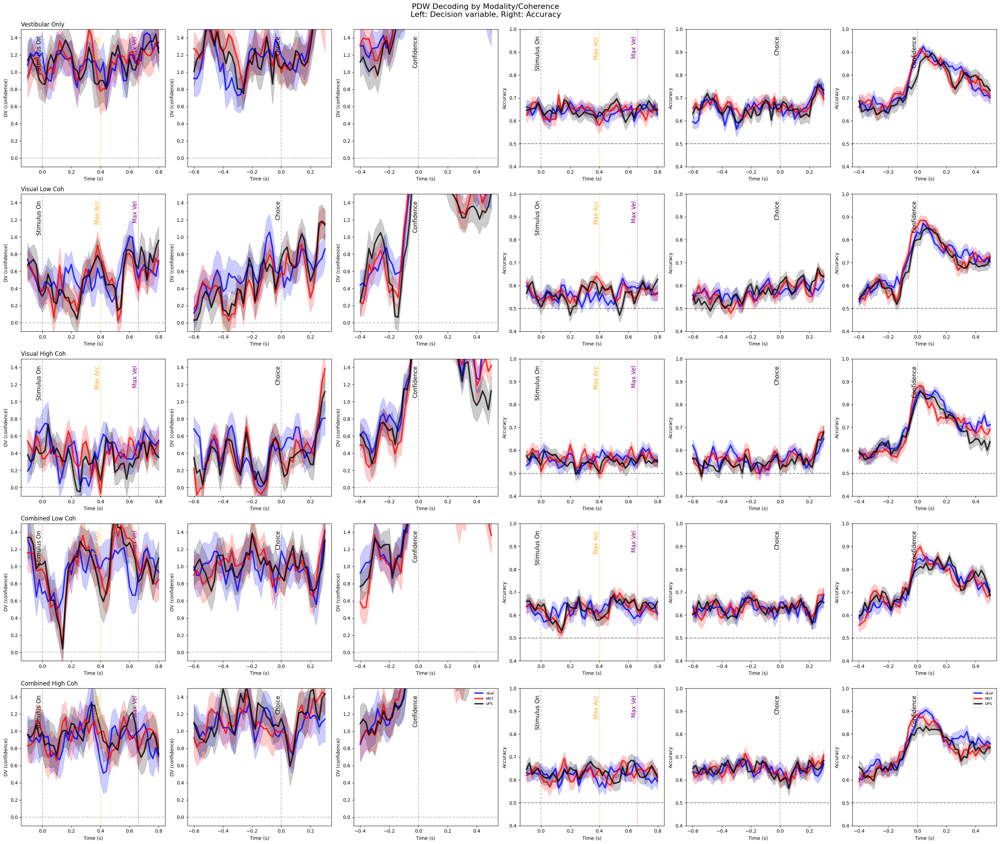

In [34]:

# Process each target separately
for target in targets:
    print(f"\n{'#'*60}")
    print(f"PROCESSING TARGET: {target.upper()} - BY MODALITY/COHERENCE")
    print(f"{'#'*60}")
    
    # Create figure with subplots (5 rows x 6 columns: 5 conditions x (3 prob + 3 Accuracy))
    fig, axes = plt.subplots(5, 6, figsize=(30, 25))
    
    all_stats = {}
    
    for j, alignment in enumerate(alignments):
        print(f"\n{'='*20} {alignment.upper()} {'='*20}")
        time_axes_condition = time_axes_dots3DMP[alignment]
        alignment_stats = {}
        
        # Initialize time_axes
        time_axes = None
        
        for area in areas:
            color = area_colors[area]
            
            print(f"\n{area}:")
            
            # Process each modality/coherence condition (each row)
            for i, (condition_name, condition_params) in enumerate(modality_conditions.items()):
                mod = condition_params['mod']
                coh = condition_params['coh']
                
                print(f"\n  {condition_name} (mod={mod}, coh={coh}):")
                
                # Collect trials from all dates for this specific condition
                all_trials = []
                successful_dates = 0
                
                for date in dates:
                    # Get the correct filepath for this condition
                    filepath = get_filepath(date, area, alignment, target, mod, coh)
                    
                    try:
                        # Load results
                        results = np.load(filepath, allow_pickle=True).item()
                        trial_results = results['trial_results']
                        
                        # Add all trials to the pool
                        all_trials.extend(trial_results)
                        
                        successful_dates += 1
                        print(f"    {date}: loaded {len(trial_results)} trials")
                        
                    except FileNotFoundError:
                        print(f"    {date}: File not found - {filepath}")
                        continue
                    except Exception as e:
                        print(f"    {date}: Error - {str(e)}")
                        continue
                
                if successful_dates == 0:
                    print(f"    No data found for {area} {condition_name}")
                    continue
                
                print(f"    Total trials: {len(all_trials)} from {successful_dates} dates")
                
                # Set target-specific labels
                if target == 'choice':
                    class_0_label = f'{area}'
                    ylabel = 'DV (heading angle)'
                elif target == 'stimulus':
                    class_0_label = f'{area}'
                    ylabel = 'DV (choice)'
                elif target == 'PDW':
                    class_0_label = f'{area}'
                    ylabel = 'DV (confidence)'
                
                # Process trials for this condition
                if all_trials:
                    time_points = sorted(list(set([trial['time'] for trial in all_trials])))
                    
                    pooled_mean_accuracy = []
                    pooled_std_accuracy = []
                    dv_mean = []
                    dv_std = []
                    
                    for t in time_points:
                        time_trials = [trial for trial in all_trials if trial['time'] == t]
                        
                        if time_trials:
                            dvs = []
                            
                            for trial in time_trials:
                                # Handle both old and new formats
                                if isinstance(trial['y_test'], (list, np.ndarray)) and len(trial['y_test']) > 1:
                                    # Old format: multiple values per trial
                                    y_test = trial['y_test']
                                    y_proba = trial['y_proba']
                                    

                                else:
                                    # New format: single value per trial
                                    y_test = trial['y_test'][0] if isinstance(trial['y_test'], (list, np.ndarray)) else trial['y_test']
                                    y_proba = trial['y_proba'][0] if isinstance(trial['y_proba'], (list, np.ndarray)) else trial['y_proba']

                                # Calculate decision variable
                                dv = calculate_decision_variable(y_test, y_proba)
                                dvs.append(dv)
                            
                            dv_mean.append(np.mean(dvs))
                            dv_std.append(np.std(dvs) / np.sqrt(len(dvs)))
                            
                            # accuracy calculation
                            time_accuracies = [trial['accuracy'] for trial in time_trials]
                            pooled_mean_accuracy.append(np.mean(time_accuracies))
                            pooled_std_accuracy.append(np.std(time_accuracies) / np.sqrt(len(time_accuracies)))
                        else:
                            dv_mean.append(np.nan)
                            dv_std.append(0)
                            pooled_mean_accuracy.append(0.5)
                            pooled_std_accuracy.append(0)
                    
                    
                    # Plot Probability (left panel: columns 0, 1, 2)
                    ax_dv = axes[i, j]
                    
                    # Plot dv
                    ax_dv.plot(time_axes_condition, dv_mean, color=color, linestyle='-', 
                               linewidth=3, label=class_0_label, alpha=0.8)
                    ax_dv.fill_between(time_axes_condition, 
                                       np.array(dv_mean) - np.array(dv_std),
                                       np.array(dv_mean) + np.array(dv_std),
                                       alpha=0.2, color=color)
                    
                    
                    # Plot Accuracy (right panel: columns 3, 4, 5)
                    ax_accuracy = axes[i, j + 3]
                    ax_accuracy.plot(time_axes_condition, pooled_mean_accuracy, color=color, linestyle='-', 
                              linewidth=3, label=f'{area}', alpha=0.8)
                    ax_accuracy.fill_between(time_axes_condition, 
                                       np.array(pooled_mean_accuracy) - np.array(pooled_std_accuracy),
                                       np.array(pooled_mean_accuracy) + np.array(pooled_std_accuracy),
                                       alpha=0.2, color=color)
        
        # Format all subplots for this alignment (column j for prob, j+3 for Accuracy)
        for i, condition_name in enumerate(modality_conditions.keys()):
            # Format Probability subplot
            ax_dv = axes[i, j]
            ax_dv.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
            ax_dv.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            # Add velocity markers for stimOn alignment with text annotations
            if alignment == 'stimOn':
                ax_dv.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_dv.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
                
                # Add text annotations at the top of the plot
                ax_dv.text(vel_markers['max_acceleration'], 0.95, 'Max Acc', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='orange', fontsize=12, transform=ax_dv.get_xaxis_transform())
                ax_dv.text(vel_markers['max_velocity'], 0.95, 'Max Vel', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='purple', fontsize=12, transform=ax_dv.get_xaxis_transform())
            
            # Add text annotation for alignment line with proper alignment name
            ax_dv.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='black', fontsize=12,
                       transform=ax_dv.get_xaxis_transform())
            
            ax_dv.set_xlabel('Time (s)')
            ax_dv.set_ylabel(ylabel)
            
            # Add titles
            if j == 0:  # First column only
                ax_dv.set_title(f'{condition_name}', fontsize=12, loc='left')
            
            # Only show legend on the last probability subplot (bottom right of prob panels)
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_dv.legend(fontsize=8)
            
            ax_dv.set_ylim(-0.1, 1.5)
            
            # Format AUC subplot
            ax_accuracy = axes[i, j + 3]
            ax_accuracy.axhline(y=0.5, color='black', linestyle='--', alpha=0.5)
            ax_accuracy.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
            
            # Add velocity markers for stimOn alignment with text annotations
            if alignment == 'stimOn':
                ax_accuracy.axvline(x=vel_markers['max_acceleration'], color='orange', linestyle=':', alpha=0.7)
                ax_accuracy.axvline(x=vel_markers['max_velocity'], color='purple', linestyle=':', alpha=0.7)
                
                # Add text annotations at the top of the plot
                ax_accuracy.text(vel_markers['max_acceleration'], 0.95, 'Max Acc', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='orange', fontsize=12, transform=ax_accuracy.get_xaxis_transform())
                ax_accuracy.text(vel_markers['max_velocity'], 0.95, 'Max Vel', 
                           rotation=90, verticalalignment='top', horizontalalignment='right',
                           color='purple', fontsize=12, transform=ax_accuracy.get_xaxis_transform())
            
            # Add text annotation for alignment line with proper alignment name
            ax_accuracy.text(0, 0.95, alignment_names[alignment], rotation=90, verticalalignment='top', 
                       horizontalalignment='right', color='black', fontsize=12,
                       transform=ax_accuracy.get_xaxis_transform())
            
            ax_accuracy.set_xlabel('Time (s)')
            ax_accuracy.set_ylabel('Accuracy')
            
            
            # Only show legend on the last AUC subplot (bottom right of AUC panels)
            if i == len(modality_conditions) - 1 and j == len(alignments) - 1:
                ax_accuracy.legend(fontsize=8)
            
            ax_accuracy.set_ylim(0.4, 1.0)
    
    # Add overall title
    fig.suptitle(f'{target.upper()} Decoding by Modality/Coherence\nLeft: Decision variable, Right: Accuracy', 
                 fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, left=0.05)
    
    # Save the figure
    save_filename = f"D:\\Neural-Pipeline\\results\\analysis_population\\dv_accuracy_{target}_zarya_by_modality_coherence.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"\nFigure saved as: {save_filename}")
    
    plt.show()